<a href="https://colab.research.google.com/github/rmccormick314/GFSAD/blob/main/people-and-planet-ai/land-cover-classification/cloud-tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# @title ###### Licensed to the Apache Software Foundation (ASF), Version 2.0 (the "License")

# Licensed to the Apache Software Foundation (ASF) under one
# or more contributor license agreements. See the NOTICE file
# distributed with this work for additional information
# regarding copyright ownership. The ASF licenses this file
# to you under the Apache License, Version 2.0 (the
# "License"); you may not use this file except in compliance
# with the License. You may obtain a copy of the License at
#
#   http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing,
# software distributed under the License is distributed on an
# "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY
# KIND, either express or implied. See the License for the
# specific language governing permissions and limitations
# under the License.

# 🌍 Land cover with TensorFlow

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/cloud-tensorflow.ipynb)

For centuries humans have created maps to help us understand our world, and to ultimately serve as guides.

Imagine what would be possible by having a map that could **dynamically** and with **great accuracy** show you how the Earth has changed **week over week**, month over month, year over year.

We could get a birds eye view of the impact or health of different resources such as food, freshwater management, wildlife and ecosystems conservation, sustainable urban development, climate change, public health, etc.

On a global scale, we can **quantify forest and ecosystem loss** due to changes in the way land is used from human activity such as agriculture and animal farming.

> _"Currently, land cover maps take months to years to produce."_
>
> _-- Tanya Birch, Program Manager, Forest & Nature at Google Earth Outreach_

> [Watch the video in YouTube<br> ![thumbnail](http://img.youtube.com/vi/zImQf91ffFo/0.jpg)](https://youtu.be/zImQf91ffFo)

![Land cover change](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/images/land-cover-change.gif?raw=1)
> _Land cover change for the Camp Fire in 2018, California._

---

This is an **interactive** notebook that contains **all** of the **code** necessary to train a simple Machine Learning model for land cover classification.

This is a first step **introductory example** of how these **satellite images** can be used to detect changes on the Earth.

* ⏲️ **Time estimate**: 1 hour
* 💰 **Cost estimate**: Around **$1.00 USD** (_free_ if you use \$300 [Cloud credits](https://cloud.google.com/free/docs/gcp-free-tier))

💚 This is one of many **machine learning how-to samples** inspired from **real climate solutions** aired on the [People and Planet AI 🎥 series](https://www.youtube.com/playlist?list=PLIivdWyY5sqI-llB35Dcb187ZG155Rs_7).

## 📒 Using this interactive notebook

Click the **run** icons ▶️ of each section within this notebook.

![Run cell](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/images/run-cell.png?raw=1)

> 💡 Alternatively, you can run the currently selected cell with `Ctrl + Enter` (or `⌘ + Enter` in a Mac).

This **notebook code lets you train and deploy an ML model** from end-to-end. When you run a code cell, the code runs in the notebook's runtime, so you're not making any changes to your personal computer.

> ⚠️ **To avoid any errors**, wait for each section to finish in their order before clicking the next “run” icon.

This sample must be connected to a **Google Cloud project**, but nothing else is needed other than your Google Cloud project.

You can use an _existing project_. Alternatively, you can create a new Cloud project [with cloud credits for free.](https://cloud.google.com/free/docs/gcp-free-tier)

## 🛸 Steps summary

This notebook is friendly for _beginner_, _intermediate_, and _advanced_ users of geospatial, data analytics and machine learning.

Here's a quick summary of what you’ll go through:

1. **📚 Understand the data**:
  Go through what we want to achieve and explore the data we want to use as _inputs and outputs_ for our model.

1. **🗄 Create the datasets** _(~20 minutes, costs [a few cents](https://cloud.google.com/dataflow/pricing))_:
  Learn to use
  [Apache Beam](https://beam.apache.org/)
  to fetch data from
  [Earth Engine](https://earthengine.google.com/)
  in parallel, and create a dataset for our model in
  [Dataflow](https://cloud.google.com/dataflow).

1. **🧠 Train the model** _(~10 minutes, costs [a few cents](https://cloud.google.com/vertex-ai/pricing#custom-trained_models))_:
  Build a simple _Fully Convolutional Network_ in
  [TensorFlow Keras](https://www.tensorflow.org/)
  and train it in
  [Vertex AI](https://cloud.google.com/vertex-ai/docs/training/custom-training)
  with the dataset we created.

1. **🔮 Model predictions**:
  Get predictions of data the model has never seen before.

  * 💻 **Local predictions** _(~5 minutes)_: Get predictions directly in this notebook without hosting the model.

  * ☁️ **Cloud Run predictions** _(~10 minutes, [cost covered by free tier](https://cloud.google.com/run/pricing))_: Host the model in [Cloud Run](https://cloud.google.com/run), an easy to use and scalable serverless web service.

  * 🧺 **Dataflow batch predictions** _(~15 minutes, costs [a few cents](https://cloud.google.com/dataflow/pricing))_: Launch a scalable batch prediction [Dataflow](https://cloud.google.com/dataflow) pipeline, perfect for historical data.

  * 🌍 **Earth Engine with AI Platform** _(~10 minutes, costs [a few cents **per hour**](https://cloud.google.com/vertex-ai/pricing))_: Get predictions directly in Earth Engine as `ee.Image`s with an [AI Platform](https://cloud.google.com/ai-platform/docs/technical-overview) model.

1. (Optional) **🛠 Delete the project** to avoid ongoing costs.

# 🎬 Before you begin

We first need to install all the requirements for the sample residing in GitHub.

The sample contains a
[`requirements.txt`](requirements.txt)
file, and a
[`constraints.txt`](constraints.txt)
with all the dependencies we need to install, so let's use that.

In [ ]:
repo_url = "https://raw.githubusercontent.com/GoogleCloudPlatform/python-docs-samples/main/people-and-planet-ai/land-cover-classification"

!wget --quiet {repo_url}/requirements.txt

> 💡 For more information about the `requirements.txt` files, see the [`pip` user guide](https://pip.pypa.io/en/stable/user_guide/).

In [ ]:
!pip install --quiet --upgrade pip

In [ ]:
# Install the dependencies.
!pip install --quiet -r requirements.txt

# Restart the runtime by ending the process.
exit()

> **🛑 Restart the runtime 🛑**

Colab already comes with many dependencies pre-loaded.
In order to ensure everything runs as expected, we **_must_ restart the runtime**. This allows Colab to load the latest versions of the libraries.

!["Runtime" > "Restart runtime"](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/images/restart-runtime.png?raw=1)

# ☁️ My Google Cloud resources

First, choose the Google Cloud _location_ where you want to run this sample.
A good place to start is by choosing your [Google Cloud location](https://cloud.google.com/compute/docs/regions-zones).

> ⚠️ Make sure you choose a location
> available for all products: [Cloud Storage](https://cloud.google.com/storage/docs/locations),
> [Vertex AI](https://cloud.google.com/vertex-ai/docs/general/locations),
> [Dataflow](https://cloud.google.com/dataflow/docs/resources/locations), and
> [Cloud Run](https://cloud.google.com/run/docs/locations).

> 💡 Prefer locations that are geographically closer to you with
> [low carbon emissions](https://cloud.google.com/sustainability/region-carbon), highlighted with the
> ![Leaf](https://cloud.google.com/sustainability/region-carbon/gleaf.svg) icon.

Make sure you have followed these steps to configure your Google Cloud project:

1. Enable the APIs: _Dataflow, Earth Engine, Vertex AI, and Cloud Run_

  <button>

  [Click here to enable the APIs](https://console.cloud.google.com/flows/enableapi?apiid=dataflow.googleapis.com,earthengine.googleapis.com,aiplatform.googleapis.com,run.googleapis.com)
  </button>

1. Create a Cloud Storage bucket in your desired _location_.

  <button>

  [Click here to create a new Cloud Storage bucket](https://console.cloud.google.com/storage/create-bucket)
  </button>

1. Register your
  [Compute Engine default service account](https://console.cloud.google.com/iam-admin/iam)
  on Earth Engine.

  <button>

  [Click here to register your service account on Earth Engine](https://signup.earthengine.google.com/#!/service_accounts)
  </button>

Once you have everything ready, you can go ahead and fill in your Google Cloud resources in the following code cell.
Make sure you run it!

In [ ]:
from __future__ import annotations

import os
from google.colab import auth

auth.authenticate_user()

# Please fill in these values.
project = ""  # @param {type:"string"}
bucket = ""  # @param {type:"string"}
location = "us-central1"  # @param {type:"string"}

# Quick input validations.
assert project, "⚠️ Please provide a Google Cloud project ID"
assert bucket, "⚠️ Please provide a Cloud Storage bucket name"
assert not bucket.startswith(
    "gs://"
), f"⚠️ Please remove the gs:// prefix from the bucket name: {bucket}"
assert location, "⚠️ Please provide a Google Cloud location"

# Set GOOGLE_CLOUD_PROJECT for google.auth.default().
os.environ["GOOGLE_CLOUD_PROJECT"] = project

# Set the gcloud project for other gcloud commands.
!gcloud config set project {project}

Updated property [core/project].


In [ ]:
# Now let's get the code from GitHub and navigate to the sample.
!git clone https://github.com/GoogleCloudPlatform/python-docs-samples.git
%cd python-docs-samples/people-and-planet-ai/land-cover-classification

Next, we have to authenticate Earth Engine and initialize it.
Since we've already authenticated to this [Colab](https://www.youtube.com/watch?v=rNgswRZ2C1Y) and saved them as the [Google default credentials](https://google-auth.readthedocs.io/en/master/reference/google.auth.html#google.auth.default),
we can reuse those credentials for Earth Engine.

> 💡 Since we're making **large amounts of automated requests to Earth Engine**, we want to use the
[high-volume endpoint](https://developers.google.com/earth-engine/cloud/highvolume).

In [ ]:
import ee
import google.auth

credentials, _ = google.auth.default()
ee.Initialize(
    credentials.with_quota_project(None),
    project=project,
    opt_url="https://earthengine-highvolume.googleapis.com",
)

# 📚 Understand the data

The goal of our model is using satellite images to do _land cover_ classification.
Specifically, we want classifications for **every pixel** in an image.
This kind of problem is called _image segmentation_.

Land cover is used in climate, energy, water, agriculture, conservation, and many other sectors.

We will be creating a simplified version of the
[Dynamic World](https://developers.google.com/earth-engine/tutorials/community/introduction-to-dynamic-world-pt-1)
model.
That's a high resolution (10 meters per pixel) land cover map for every image from the
[Sentinel 2](https://sentinel.esa.int/web/sentinel/missions/sentinel-2) satellite mission.

In [ ]:
from visualize import show_legend

# These are the classifications we want to predict with
# the color palette associated with them.
show_legend()

    💧 Water
    🌳 Trees
    🌾 Grass
    🌿 Flooded vegetation
    🚜 Crops
    🪴 Shrub and scrub
    🏗️ Built-up areas
    🪨 Bare ground
    ❄️ Snow and ice


We can use
[Folium](https://python-visualization.github.io/folium/)
to visualize how the Dynamic World land cover map looks for a region in Vietnam’s Mekong Delta region.

In [ ]:
import ee
import folium

from visualize import CLASSIFICATIONS

image = (
    ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1")
    .filterDate("2020-1-1", "2021-1-1")
    .median()
)

vis_params = {
    "max": len(CLASSIFICATIONS) - 1,
    "palette": list(CLASSIFICATIONS.values()),
    "bands": ["label"],
}
folium.Map(
    location=(9.883, 105.695),
    zoom_start=10,
    tiles=image.getMapId(vis_params)["tile_fetcher"].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
)

> ![Dynamic World map in Earth Engine](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/images/dynamic-world-map.png?raw=1)

We can immediately see that there's the river delta, there are lots of roads, some urban areas, most of it are crops, while there are some areas of forest left.

This gives us an idea of the kind of maps we'll be creating!

## 🛰 **Inputs**: Sentinel 2 images

Like Dynamic World, we'll be using the
[Sentinel-2 MultiSpectral dataset](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_HARMONIZED)
from Earth Engine.
However, for simplicity, we'll be using 1-year composites instead of analyzing each individual image.

Here's an example image of a
[copper mine in Cananea, Sonora, Mexico](https://earthobservatory.nasa.gov/images/8680/cananea-copper-mine-sonora-mexico).

In [ ]:
import folium

from serving import data

image = data.get_input_image(2020)
vis_params = {
    "min": 0,
    "max": 3000,
    "bands": ["B4", "B3", "B2"],
}
folium.Map(
    location=(30.95, -110.29),
    zoom_start=13,
    tiles=image.getMapId(vis_params)["tile_fetcher"].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
)

> ![Sentinel 2 map in Earth Engine](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/images/sentinel2-map.png?raw=1)

We can see the open-pit mine at the left of the image, one of the largest in the world, with a large pool of
[leachate](https://en.wikipedia.org/wiki/Leachate)
at the right.
The city of Cananea is inbetween them at the north.

## 🗺 **Labels**: Land cover map

For our _labels_, we'll use the
[European Space Agency WorldCover map](https://developers.google.com/earth-engine/datasets/catalog/ESA_WorldCover_v100),
which is a 10 meter resolution land cover map of the entire world for the year 2020.
Since we only have labels from 2020, using the Sentinel-2 median for the entire year makes things easier.

Here's how the same copper mine in Sonora looks like in the land cover map.

In [ ]:
import folium

from serving import data
from visualize import CLASSIFICATIONS

image = data.get_label_image()
vis_params = {
    "bands": ["landcover"],
    "max": len(CLASSIFICATIONS) - 1,
    "palette": list(CLASSIFICATIONS.values()),
}
folium.Map(
    location=(30.95, -110.29),
    zoom_start=13,
    tiles=image.getMapId(vis_params)["tile_fetcher"].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
)

> ![European Space Agency WorldMap](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/land-cover-classification/images/esa-worldmap.png?raw=1)

We can see there's a clear distinction between the "natural world" and the "human-made world".
The mining complex itself looks like _bare ground_, which makes sense since all the topsoil has been removed to scratch the inner minerals.
The surrounding areas look like mostly _shrub_, _scrub_, _grasses_, and some _trees_.
We can also see the _built-up_ roads from the city of Cananea at the northern area.

There are multiple pools of
[leachate](https://en.wikipedia.org/wiki/Leachate)
used for the ore extraction, classified as "water" by the land cover map.

# 🗄 Create the dataset

The first thing we need is to create a _dataset_ for our model.
A _dataset_ is a collection _training examples_, which are _(inputs, labels)_ pairs.
We'll fetch data from Earth Engine and save it as data files.
For large datasets, it's faster to process the data in parallel.

[Apache Beam](https://beam.apache.org)
allows us to define parallel data pipelines, which we can then run in a distributed runner like
[Dataflow](https://cloud.google.com/dataflow).

## 📌 Sample points

We want to create a balanced dataset.
Fortunately, we can use the
[`ee.Image.stratifiedSample`](https://developers.google.com/earth-engine/apidocs/ee-image-stratifiedsample)
function in Earth Engine to get an approximately equal number of points for each classification in our _label_ land cover map.

We need to pass it a list of polygons to sample points from.
We're passing a simplified list of polygons that cover most of the land areas in the world.
We also include an explicit _random seed_ since we want to run the sampling in parallel.
If we pass each call a different seed, we make sure to get different results.

The `sample_points` function in [`create_dataset.py`](create_dataset.py) gets a stratified sample from the land cover map from Earth Engine, and returns us a collection of _(longitude, latitude)_ pairs.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `create_dataset.py`](create_dataset.py)
> </button>

In [ ]:
from create_dataset import sample_points

seed = 0

# Simplified polygons covering most land areas in the world.
polygons = [
    # Americas
    [(-33.0, -7.0), (-55.0, 53.0), (-166.0, 65.0), (-68.0, -56.0)],
    # Africa, Asia, Europe
    [
        (74.0, 71.0),
        (166.0, 55.0),
        (115.0, -11.0),
        (74.0, -4.0),
        (20.0, -38.0),
        (-29.0, 25.0),
    ],
    # Australia
    [(170.0, -47.0), (179.0, -37.0), (167.0, -12.0), (128.0, 17.0), (106.0, -29.0)],
]

for point in sample_points(seed, polygons, points_per_class=2):
    print(point)

[-112.26253600096747, 40.72366118754205]
[-37.001681497433964, -10.93845080217163]
[-85.60053836830008, 35.02834228622428]
[-72.4042868445843, 45.565580568946274]
[-46.892132775589886, -1.5241066245990424]
[-71.03884761272263, -14.630526619902867]
[-89.77770443945586, 56.68672378634595]
[-61.50772244821451, 9.812632260989318]
[-94.88013525325474, 40.283486698323486]
[-99.05730132441052, 47.21848069172619]
[-45.859070198852436, -9.285550679391719]
[-109.63047221849727, 30.159473446296474]
[-121.40738559330421, 38.68448549259074]
[-85.65443728534726, 40.543998130718144]
[-69.36798118426033, -28.195087410107647]
[-113.98730134647695, 38.90008116077942]
[-73.59006301962208, -50.17686241251232]
[-141.42185012348716, 60.63931103647184]


> 💡 Coordinate points can be expressed either as _(latitude, longitude)_ or _(longitude, latitude)_ pairs, as long as you're consistent.
> Since _longitude_ is horizontal _(x)_, and _latitude_ is vertical _(y)_, Earth Engine uses the convention _(longitude, latitude)_ like _(x, y)_.

## 📑 Get training examples

For each coordinate point, we want to extract the surrounding _patch of pixels_.
We do this in the `get_patch` function in [`serving/data.py`](serving/data.py) with
[`ee.Image.getDownloadURL`](https://developers.google.com/earth-engine/apidocs/ee-image-getdownloadurl).
This file also includes a `get_inputs_patch` and a `get_labels_patch` to fetch the appropriate data.

The `get_training_example` in [`create_dataset.py`](create_dataset.py) gets both the _inputs_ and the _labels_ patches for a given point.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `serving/data.py`](serving/data.py)
> </button>

In [ ]:
from create_dataset import get_training_example

point = (-110.312, 30.972)  # (lon, lat)
(inputs, labels) = get_training_example(point)

# These are the types and shapes of the training example.
print(f"inputs : {inputs.dtype} {inputs.shape}")
print(f"labels : {labels.dtype} {labels.shape}")

inputs : float32 (128, 128, 13)
labels : uint8 (128, 128, 1)


> 💡 Note that we're using the _serving_ module to get the data.
This makes sure we're using data in _exactly_ the same format when we're creating the datasets and when we're serving a model for predictions.

Let's visualize how the training example looks like!

In [ ]:
from visualize import show_example, show_legend

show_example(inputs, labels)
show_legend()

The _labels_ from the ESA WorldCover map seem to be fairly accurate.
It got most of it as _bare ground_, the roads are marked as _built up_, and we can see the _water_ from the tanks.

## ✍🏽 Serialize to TFRecords

Now we need to write files containing the _training examples_ for our model.
For [TensorFlow](https://www.tensorflow.org), the recommended way is to store data files as [TFRecords and `tf.train.Example`](https://www.tensorflow.org/tutorials/load_data/tfrecord).

The `serialize_tensorflow` function in [`create_dataset.py`](create_dataset.py) takes an _(inputs, labels)_ pair of
[NumPy arrays](https://numpy.org/doc/stable/reference/arrays.html), and serializes them into a
[`tf.train.Example`](https://www.tensorflow.org/api_docs/python/tf/train/Example).
A `tf.train.Example` can only store
bytes, floats, and int64s and it does **not** store the shape information.
So we serialize each tensor with [`tf.io.serialize_tensor`](https://www.tensorflow.org/api_docs/python/tf/io/serialize_tensor) first.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `create_dataset.py`](create_dataset.py)
> </button>

In [ ]:
from create_dataset import serialize_tensorflow

serialized = serialize_tensorflow(inputs, labels)
print(f"serialized: {len(serialized)} bytes")

serialized: 868448 bytes


## 🗃 Create the dataset

Finally, we create an
[Apache Beam](https://beam.apache.org/) pipeline, which allows us to create parallel processing pipelines.

Let's see how to create a small dataset!
This should take around 5 minutes.

In [ ]:
import apache_beam as beam
from apache_beam.options.pipeline_options import PipelineOptions

with beam.Pipeline() as pipeline:
    (
        pipeline
        | "🌱 Make seeds" >> beam.Create([0])
        | "🛰 Sample points" >> beam.FlatMap(sample_points, polygons, points_per_class=1)
        | "📖 Get examples" >> beam.Map(get_training_example)
        | "✍🏽 Serialize" >> beam.MapTuple(serialize_tensorflow)
        | "📚 Write TFRecords"
        >> beam.io.WriteToTFRecord("data/part", file_name_suffix=".tfrecord.gz")
    )

> 💡 For more information on how to use Apache Beam, refer to the
> [Tour of Beam](https://beam.apache.org/get-started/tour-of-beam/).

In [ ]:
# Let's take a look at the dataset files.
!ls -lh data

## ☁️ Run in Dataflow

Local testing works great for creating small datasets and making sure everything works, but to run on a large dataset at scale it's best to use a distributed runner like
[Dataflow](https://cloud.google.com/dataflow).

The Apache Beam pipeline is very similar to the one we used locally, but it has some differences to run in a distributed environment.
First we need to configure the `PipelineOptions` and set `save_main_session` to `True` so the Dataflow workers have access to the functions we defined in [`create_dataset.py`](create_dataset.py).
We also need a [`setup.py`](setup.py) file to build and include the [`serving`](serving) package, which is needed to access the functions that fetch data from Earth Engine.
With this we make sure we fetch the input data for the model exactly the same when creating the dataset and when serving model predictions.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `create_dataset.py`](create_dataset.py)
> </button>

In [ ]:
points_per_class = 100

!python create_dataset.py "tensorflow" \
  --data-path="gs://{bucket}/land-cover/data" \
  --points-per-class="{points_per_class}" \
  --runner="DataflowRunner" \
  --project="{project}" \
  --region="{location}" \
  --temp_location="gs://{bucket}/land-cover/temp"

> 💡 Look at your Dataflow jobs: https://console.cloud.google.com/dataflow/jobs

We also need to set the minimum disk size of the workers to 50 GB since updating to the latest version of TensorFlow and installing the rest of the requirements runs out of disk space in the workers during the setup phase with the default disk size.

Another difference is that we use
[`beam.Reshuffle`](https://beam.apache.org/releases/pydoc/current/apache_beam.transforms.util.html?highlight=reshuffle#apache_beam.transforms.util.Reshuffle).
right after sampling the points.
The reason is that we begin with a single _seed_ value, and expand during `sample_points` into hundreds or thousands of points.
Dataflow does
[fusion as an optimization](https://cloud.google.com/dataflow/docs/guides/deploying-a-pipeline#fusion-optimization)
which combines multiple transforms and steps into a single function.
This means that the entire function would run in a single worker, so all the points could run sequentially.
`Reshuffle` breaks the fusion and make sure every data point is fetched and processed in parallel.

> 💡 To learn more on when to use `Reshuffle`, see this
> [Stack Overflow post](https://stackoverflow.com/a/54131856/11638084)

Apache Beam and Dataflow don't have any ordering guarantees, and especially after the Reshuffle the resulting dataset should be fairly randomized.

# 🧠 Train the model

Now that we have our dataset, we're ready to train the model.

## 📖 Read the datasets

The `read_dataset` function in [`trainer/tf_model.py`](trainer/tf_model.py) uses
[`tf.data.TFRecordDataset`](https://www.tensorflow.org/api_docs/python/tf/data/TFRecordDataset)
to read the TFRecord files.
It does not attempt to parse the contents, so we get a bunch of bytes for every example and we have to parse them ourselves.
So we map the function `read_example` to the dataset, which first parses the serialized example with
[`tf.io.parse_single_example`](https://www.tensorflow.org/api_docs/python/tf/io/parse_single_example) into a _(serialized_inputs, serialized_labels)_ pair.
Then we use
[`tf.io.parse_tensor`](https://www.tensorflow.org/api_docs/python/tf/io/parse_tensor) to parse the serialized input and label tensors.
Finally, we convert the labels into one-hot encoded vectors using
[`tf.one_hot`](https://www.tensorflow.org/api_docs/python/tf/one_hot).
With this, we get back the original training data. 😓

Next, we use `split_dataset` from [`trainer/tf_model.py`](trainer/tf_model.py) to split the entire dataset into a _training_ and a _testing_ dataset (also called validation dataset).
The model uses the _training dataset_ to learn and adjust.
It then uses the _testing dataset_ like an exam to see how well it did on data it has never seen before.
This also batches the training examples into groups, which allows the model to go through the data more efficiently and to see more examples at once.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `trainer/tf_model.py`](trainer/tf_model.py)
> </button>

In [ ]:
from trainer.tf_model import read_dataset

data_path = f"gs://{bucket}/land-cover/data"
dataset = read_dataset(data_path)

for x, y in dataset.take(1):
    print("inputs:", x.dtype.name, x.shape)
    print("labels:", y.dtype.name, y.shape)

inputs: float32 (128, 128, 14)
labels: float32 (128, 128, 9)


> 💡 We apply some other optimizations to the datasets.
> For more information on how to optimize your tf.data.Dataset, please refer to the
> [Better performance with the tf.data API](https://www.tensorflow.org/guide/data_performance) guide.

## 🐣 Create the model

First we define our model, which is a very simple _Fully Convolutional Network_.
The input data can consist of potentially very large numbers, but machine learning generally prefers small numbers around -1 and 1.
So we use a [Normalization](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Normalization) layer from the Keras [preprocessing layers](https://www.tensorflow.org/guide/keras/preprocessing_layers).
This finds the _mean_ and _variance_ from the _training dataset_ and uses those values to normalize all the incoming data to the model as a first step.

The model then passes the data through a
[2D Convolutional layer](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D) for downsampling, and then through a
[2D DeConvolutional layer](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose) for upsampling, so we end up with images the same size as the input image.

For the last layer, we use a [Dense](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense) with the same number of outputs as the number of classifications we have, here we have 9 classes.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, None, None, 14)   29        
 n)                                                              
                                                                 
 conv2d (Conv2D)             (None, None, None, 32)    11232     
                                                                 
 conv2d_transpose (Conv2DTra  (None, None, None, 16)   12816     
 nspose)                                                         
                                                                 
 dense (Dense)               (None, None, None, 9)     153       
                                                                 
Total params: 24,230
Trainable params: 24,201
Non-trainable params: 29
_________________________________________________________________


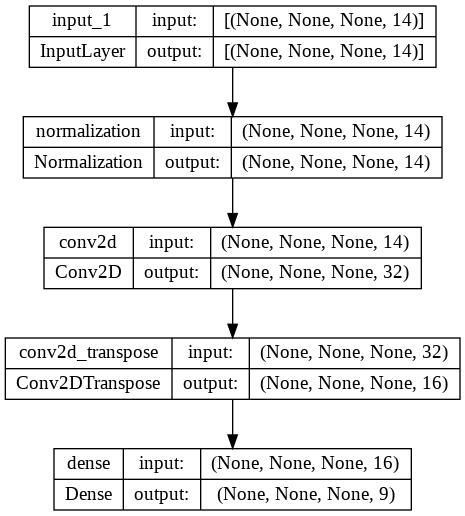

In [ ]:
import tensorflow as tf
from trainer.tf_model import create_model, split_dataset

(train_dataset, test_dataset) = split_dataset(dataset)
model = create_model(train_dataset)

model.summary()
tf.keras.utils.plot_model(model, show_shapes=True)

> 💡 Note that we should **not** normalize or preprocess over the _entire dataset_.
> It would be _cheating_ if the model looks into data from the _validation dataset_ during creation or training.
> _Always_ normalize and preprocess over the _training dataset_ only!

Finally, we train the model with [`Model.fit`](https://www.tensorflow.org/api_docs/python/tf/keras/Model#fit), and save the trained model with [`Model.save`](https://www.tensorflow.org/api_docs/python/tf/keras/Model#save).
The number of _epochs_ is the number of times the model will go through the entire _training dataset_.

In [ ]:
# Number of times to go through the training dataset.
epochs = 5

# Train the model.
model.fit(train_dataset, validation_data=test_dataset, epochs=epochs)

# Save it as files.
model.save("model")

Epoch 1/5
1/1 [==============================] - 3s 3s/step - loss: 2.1539 - one_hot_io_u: 0.0697
Epoch 2/5
1/1 [==============================] - 1s 625ms/step - loss: 1.8910 - one_hot_io_u: 0.1239
Epoch 3/5
1/1 [==============================] - 1s 552ms/step - loss: 1.7831 - one_hot_io_u: 0.1765
Epoch 4/5
1/1 [==============================] - 1s 564ms/step - loss: 1.7177 - one_hot_io_u: 0.1887
Epoch 5/5
1/1 [==============================] - 1s 567ms/step - loss: 1.6552 - one_hot_io_u: 0.2430


We see that the `loss` is gradually getting smaller, and the `val_loss` as well.
They don't deviate too much, so it doesn't look like it's overfitting, but it's too little data and epochs to know for sure.

## ☁️ Run in Vertex AI

Training a model locally is great to see that the model was defined correctly.
However, with a larger dataset, each epoch takes more time to complete.
We would also like to train our model for a larger number of epochs.
Since we have convolutional layers, they also benefit greatly from hardware accelerators like GPUs and TPUs.

We can use [Vertex AI](https://cloud.google.com/vertex-ai) to easily train our model at scale, even with hardware accelerators.
Let's train our model with a larger number of epochs, and using GPUs with one of the [Vertex AI pre-built containers](https://cloud.google.com/vertex-ai/docs/training/pre-built-containers#tensorflow).

In [ ]:
from google.cloud import aiplatform

epochs = 100

aiplatform.init(project=project, location=location, staging_bucket=bucket)

# https://cloud.google.com/python/docs/reference/aiplatform/latest/google.cloud.aiplatform.CustomTrainingJob
job = aiplatform.CustomTrainingJob(
    display_name=f"land-cover",
    script_path="trainer/tf_model.py",
    container_uri="us-docker.pkg.dev/vertex-ai/training/tf-gpu.2-9:latest",
)

job.run(
    machine_type="n1-highmem-8",
    accelerator_type="NVIDIA_TESLA_T4",
    accelerator_count=1,
    args=[
        f"--data-path=/gcs/{bucket}/land-cover/data",
        f"--model-path=/gcs/{bucket}/land-cover/model-large",
        f"--epochs={epochs}",
    ],
)

> 💡 Look at your Vertex AI training jobs: https://console.cloud.google.com/vertex-ai/training/training-pipelines

# 🔮 Model predictions

The model behaves like a _function_.
Here, it takes Sentinel-2 data as inputs, and it returns us the probabilities of each pixel being each land cover classification.

Here are some different options to get predictions from our model.

* 💻 **Local predictions**: Simply loading the model in your laptop or a notebook.
  If you only need a handful of one-time predictions, this is the easiest way.

  > _Cons:_ It doesn't scale to a large number of predictions, and your predictions live outside of Earth Engine.

* ☁️ **[Cloud Run](https://cloud.google.com/run) predictions**: Deploy the model as a scalable and serverless web service.
  This is an easy, flexible, and low cost option.

  > _Cons:_ Your predictions live outside of Earth Engine.

* 🧺 **[Dataflow](https://cloud.google.com/dataflow) batch predictions**: Run a batch pipeline to do predictions at scale on large amounts of data.
  This is a great option to process large amounts of historical data.

  > _Cons:_ Your predictions live outside of Earth Engine.

* 🌍 **[Earth Engine AI Platform connector](https://developers.google.com/earth-engine/guides/tensorflow)**: Get real-time predictions directly in Earth Engine as an `ee.Image`.

  > _Cons:_ AI Platform hosting charges per hour, even if you're sending requests.
  > It also requires additional setup and configuration.

To run some predictions, let's take a closer look near the rural community of Concow in California, one of the places affected by the
[Camp Fire](https://en.wikipedia.org/wiki/Camp_Fire_(2018)) in November 2018.

## 💻 Local predictions

This is the easiest, and is great if you only need a handful of predictions.

We can easily load our TensorFlow Keras model using
[`tf.keras.models.load_model`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model).
We can load the model from anywhere with Python and TensorFlow installed.

In [ ]:
import tensorflow as tf

model_path = f"gs://{bucket}/land-cover/model"
model = tf.keras.models.load_model(model_path)

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, None, None, 13)   27        
 n)                                                              
                                                                 
 conv2d (Conv2D)             (None, None, None, 32)    10432     
                                                                 
 conv2d_transpose (Conv2DTra  (None, None, None, 16)   12816     
 nspose)                                                         
                                                                 
 dense (Dense)               (None, None, None, 9)     153       
                                                                 
Total params: 23,428
Trainable params: 23,401
Non-trainable params: 27
_________________________________________________________________


Let's get some data, and making sure we grab it with our [`serving`](serving) module.
This makes sure we use _exactly_ the same data we used for training.

In [ ]:
from serving import data
from visualize import show_inputs

inputs = data.get_input_patch(2018, (-121.526, 39.781), patch_size=512)
show_inputs(inputs)

Now let's give that to the model.
It returns us a _probability distribution_ with the probabilities for each classification.

In [ ]:
import numpy as np

# We had a single input, so grab the first element from the predictions.
print(f"inputs : {inputs.dtype.name} {inputs.shape}")
probabilities = model.predict(np.stack([inputs]))[0]
print(f"probabilities : {probabilities.dtype} {probabilities.shape}")

inputs : float32 (512, 512, 13)
1/1 [==============================] - 1s 1s/step
probabilities : float32 (512, 512, 9)


Finally, we get the classification with the highest probability.

In [ ]:
from visualize import show_outputs

# Get the predictions from the probability distributions.
predictions = probabilities.argmax(axis=-1).astype(np.uint8)
print(f"predictions : {predictions.dtype} {predictions.shape}")

# Our `show_outputs` function expects a shape of (width, height, 1)
# so we add an extra dimension at the end.
show_outputs(predictions[:, :, None])

predictions : uint8 (512, 512)


## ☁️ Cloud Run predictions

[Cloud Run](https://cloud.google.com/run) allows us to deploy
[_serverless_](https://en.wikipedia.org/wiki/Serverless_computing)
web services with a
[REST API](https://en.wikipedia.org/wiki/Representational_state_transfer).
Cloud Run autoscales from zero workers when there are no requests, to enough workers to handle high traffic of requests.
It's a great and efficient option to host a predictions server without having to have servers up and running all the time.

Cloud Run autoscales from zero workers when there are no requests, to enough workers to handle high traffic of requests.
It's a great and efficient option to host a predictions server without having to have servers up and running all the time.

We deploy our service to Cloud Run
[directly from source code](https://cloud.google.com/run/docs/deploying-source-code)
so we don't need to build the container image first.
Behind the scenes, this command uses Google Cloud [Buildpacks](https://buildpacks.io/) and
[Cloud Build](https://cloud.google.com/build)
to automatically build a container image from our source code in the [`serving`](serving) directory.

TensorFlow can use a lot of memory, so we increase the
[memory limit](https://cloud.google.com/run/docs/configuring/memory-limits)
for our service to 1GB.
We also want to define a default model to use by passing an
[environment variable](https://cloud.google.com/run/docs/configuring/environment-variables)
to our container image.
We can override the model path via the `model-path`
[URL query parameter](https://en.wikipedia.org/wiki/Query_string).
For Cloud Run to access the model, it _must_ be in Cloud Storage.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `serving/main.py`](serving/main.py)
> </button>

In [ ]:
service_name = "land-cover"
model_path = f"gs://{bucket}/land-cover/model"

!gcloud run deploy {service_name} \
  --source="serving/" \
  --region="{location}" \
  --update-env-vars="MODEL_PATH={model_path}" \
  --memory="1G" \
  --no-allow-unauthenticated

> 💡 Look at your Cloud Run services: https://console.cloud.google.com/run

When the Cloud Run service is deployed, you'll see some information including the Service URL.

We can also get the URL from the Cloud Console, or with [`gcloud run services describe`](https://cloud.google.com/sdk/gcloud/reference/run/services/describe).

In [ ]:
import subprocess

cmd = [
    "gcloud",
    "run",
    "services",
    "describe",
    service_name,
    f"--region={location}",
    "--format=get(status.url)",
]
model_url = (
    subprocess.run(cmd, check=True, stdout=subprocess.PIPE)
    .stdout.decode("utf-8")
    .strip()
)
print(f"model_url: {model_url}")

Since we only accept authorized calls in our web service, we also need to authenticate each call.

Colab notebooks aren't tied to a Service Account, so we can't get the identity token here.

Run this command in your **local terminal** or in [**Cloud Shell**](https://shell.cloud.google.com/?show=terminal), and then copy-paste your **🔑 Identity token** from the output of the command into the following variable and run that cell.

```sh
# Run in a terminal and copy-paste the outputs.
gcloud auth print-identity-token
```

In [ ]:
identity_token = ""  # @param {type:"string"}

> 💡 Your identity token changes over time, so you might need to generate a new one if you're getting authentication errors.

> 💡 To learn more on how to authenticate to Cloud Run, see the
> [Authentication overview](https://cloud.google.com/run/docs/authenticating/overview) page.

Now let's get some predictions from our Cloud Run service.
The service first gets the input data from Earth Engine, gets the predictions and returns them as JSON.

In [ ]:
import numpy as np
import requests

response = requests.get(
    f"{model_url}/predict/-121.526/39.781/2018",
    headers={"Authorization": f"Bearer {identity_token}"},
    params={"patch-size": 512},
)

response.raise_for_status()
results = response.json()

predictions = np.array(results["predictions"], np.uint8)
print(f"predictions : {predictions.dtype.name} {predictions.shape}")

predictions : uint8 (512, 512)


In [ ]:
from visualize import show_outputs

show_outputs(predictions[:, :, None])

> 💡 We return the prediction results as plain JSON since it's simple and human-readable.
> If you're expecting large outputs, it might be a good idea to serialize and compress the predictions response before sending them, but the receiving end would have to decompress and deserialize the results back.
> You could also write large results to a Cloud Storage location.

## 🧺 Dataflow batch prediction

[Dataflow](https://cloud.google.com/dataflow) is a distributed runner for
[Apache Beam](https://beam.apache.org), and it allows us to run data pipelines at scale.
It's a great option to batch predictions over large amounts of historical data.
Dataflow [supports GPUs](https://cloud.google.com/dataflow/docs/concepts/gpu-support)
allowing us to run hardware accelerated predictions if needed.

We made a sample batch prediction pipeline that gives us predictions for all the locations in the
[`predict-locations.csv`](predict-locations.csv)
file for all the years from 2016 to 2021, but you can adjust it for your own needs.

The Dataflow pipeline uses
[`RunInference`](https://beam.apache.org/documentation/transforms/python/elementwise/runinference)
to get predictions for the model.
It handles loading the model on each worker, and batching the model's inputs automatically.

> <button>
>
> [![Open in GitHub](https://www.tensorflow.org/images/GitHub-Mark-32px.png) `predict_batch.py`](predict_batch.py)
> </button>

In [ ]:
model_path = f"gs://{bucket}/land-cover/model"

!python predict_batch.py "tensorflow" \
  --model-path="{model_path}" \
  --predictions-path="gs://{bucket}/land-cover/predictions" \
  --runner="DataflowRunner" \
  --project="{project}" \
  --region="{location}" \
  --temp_location="gs://{bucket}/land-cover/temp"

> 💡 To learn more about Machine Learning in Apache Beam, take a look at the
[Machine Learning](https://beam.apache.org/documentation/sdks/python-machine-learning) guide.

## 🌍 Earth Engine with AI Platform

If you want to get real-time predictions from a TensorFlow model in Earth Engine, the current option is using the
[`ee.Model.fromAiPlatformPredictor`](https://developers.google.com/earth-engine/apidocs/ee-model-fromaiplatformpredictor) Earth Engine connector.
We point it to a model hosted in [AI Platform](https://cloud.google.com/ai-platform/docs/technical-overview), then feed it an input [`ee.Image`](https://developers.google.com/earth-engine/apidocs/ee-image), and it returns us an output `ee.Image` with the predictions.
You can learn more at the [TensorFlow and Earth Engine](https://developers.google.com/earth-engine/guides/tensorflow) page

> ⚠️ AI Platform charges per _node hour_.
> It does _not_ autoscale to zero nodes, so you are charged for _every hour_ your model is deployed, whether you are using it or not.
> AI Platform uses the same pricing as Vertex AI, you can learn more on the [Vertex AI pricing](https://cloud.google.com/vertex-ai/pricing) page.
> So don't forget to delete your model after you finish this tutorial.

Let's start by loading our existing model and taking a look at it.

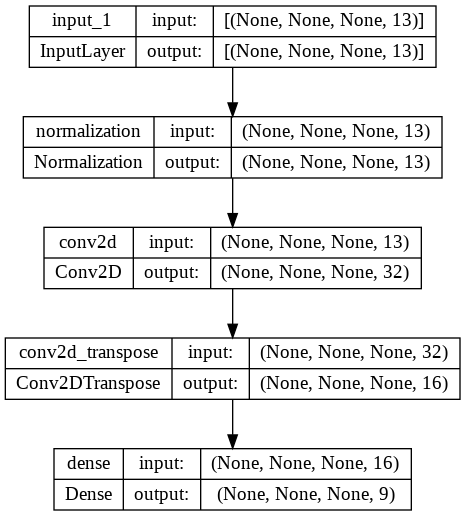

In [ ]:
import tensorflow as tf

model_path = f"gs://{bucket}/land-cover/model"
trained_model = tf.keras.models.load_model(model_path)

tf.keras.utils.plot_model(trained_model, show_shapes=True)

This is our Fully Convolutional Network.
It takes a _dense tensor_ as inputs, and returns us the _probability distribution_ for the classifications.

AI Platform accepts requests as JSON messages, but sending the inputs as plain JSON objects could get very large quickly, especially with more bands and for larger regions.
So the way Earth Engine and AI Platform communicate more efficiently is by compressing their data before sending it, but we have to adapt our model to understand compressed data.
Earth Engine uses [`tf.io.serialize_tensor`](https://www.tensorflow.org/api_docs/python/tf/io/serialize_tensor) and
[`tf.io.parse_tensor`](https://www.tensorflow.org/api_docs/python/tf/io/parse_tensor)
to convert data into a memory-efficient binary format.
However, JSON won't allow us to include binary data, so it further encodes and decodes the data to [Base64](https://en.wikipedia.org/wiki/Base64).

Fortunately, we don't have to retrain our model.
We can simply add some extra layers that decode the inputs from Earth Engine, passes the input tensors to the model, and then encodes the predictions to send them back to Earth Engine.
We call this _EEification_.

We define `ee_decode` and `ee_encode` to do this.
`ee_decode` first decodes the a _batch_ of base64 texts and then parses the tensors. `ee_encode` first serializes a _batch_ of tensors and then encodes to base64.
Note that both these functions work with _batches_ of data, not individual requests.

We also assume the model receives a _single_ band called `"array"` with the flattened values from all the bands in the image.
In other words, the model receives a single band with a _dense tensor_ containing the data from all the input bands.
Earth Engine has [`ee.Image.toArray`](https://developers.google.com/earth-engine/apidocs/ee-image-toarray) which does that, and the resulting band is named `"array"`.
Passing all the individual bands as a dictionary results in larger requests to AI Platform, and there are limits in how large they can be.
So it's always a good idea to use `toArray`.

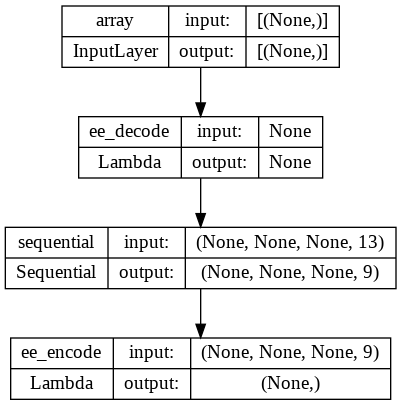

In [ ]:
import tensorflow as tf


def ee_decode(batch: tf.Tensor, dtype: tf.DType = tf.float32) -> tf.Tensor:
    parse_tensor = lambda x: tf.io.parse_tensor(x, dtype)
    return tf.map_fn(parse_tensor, tf.io.decode_base64(batch), dtype)


def ee_encode(batch: tf.Tensor) -> tf.Tensor:
    encode_tensor = lambda x: tf.io.encode_base64(tf.io.serialize_tensor(x))
    return tf.map_fn(encode_tensor, batch, tf.string)


def eeify_model(model: tf.keras.Model) -> tf.keras.Model:
    # Assume we called `ee.Image.toArray` on the input image.
    input_layers = {"array": tf.keras.Input([], dtype=tf.string, name="array")}
    eeification = [
        tf.keras.layers.Lambda(ee_decode, name="ee_decode"),
        model,
        tf.keras.layers.Lambda(ee_encode, name="ee_encode"),
    ]
    output = input_layers["array"]
    for layer in eeification:
        output = layer(output)
    return tf.keras.Model(input_layers, output)


# EEify the model and save it to Cloud Storage.
eeified_model = eeify_model(trained_model)
eeified_model.save(f"gs://{bucket}/land-cover/eeified-model")

tf.keras.utils.plot_model(eeified_model, show_shapes=True)

Now we want to deploy the EEified model to AI Platform.
First we have to create a model, we can later deploy _versions_ to it.

> 💡 AI Platform by default does _not_ enable logs since it can produce a lot of logs and can increase the cost.
> If something is not working as expected, you can create a new model with `--enable-logging` to help debugging.
> If you're using AI Platform in production, it might be a good idea to _not_ have logs enabled, and have a different model with logs enabled for debugging.

In [ ]:
model_name = "land_cover"

# You can pass --enable-logging for debugging.
!gcloud ai-platform models create {model_name} --region="{location}"

We can then create a new model version with our EEified model.

> 💡 If you change anything in your model or retrain it, make sure to EEify it again before deploying a new version!

In [ ]:
model_version = "v1"

!gcloud ai-platform versions create {model_version} \
  --model={model_name} \
  --origin="gs://{bucket}/land-cover/eeified-model" \
  --runtime-version=2.9 \
  --framework="tensorflow" \
  --region="{location}"

> 💡 Look at your AI Platform models: https://console.cloud.google.com/ai-platform/models

In [ ]:
import ee

from serving import data

# We want to hide the outer parts of the predictions
# since they didn't have enough data to give good results.
# We use the kernel_size as the size of the border we want
# to trim from the tiles.
ee_model = ee.Model.fromAiPlatformPredictor(
    projectName=project,
    modelName=model_name,
    version=model_version,
    inputTileSize=[50, 50],
    inputOverlapSize=[5, 5],
    proj=ee.Projection("EPSG:4326").atScale(data.SCALE),
    fixInputProj=True,
    outputBands={"predictions": {"type": ee.PixelType.float(), "dimensions": 1}},
)

# Convert the input image into a single dense array with
# `ee.Image.toArray` before passing it to the model.
input_image = data.get_input_image(2018)
probabilities = ee_model.predictImage(input_image.toArray())

# Use `ee.Image.arrayArgmax` to get the classification with highest
# probability for each pixel.
predictions = probabilities.arrayArgmax().arrayGet(0).byte().rename("landcover")

In [ ]:
import folium

from visualize import CLASSIFICATIONS

sentinel2_vis = {
    "bands": ["B4", "B3", "B2"],
    "min": 0,
    "max": 3000,
}
landcover_vis = {
    "bands": ["landcover"],
    "max": len(CLASSIFICATIONS) - 1,
    "palette": list(CLASSIFICATIONS.values()),
}
map = folium.Map([39.781, -121.526], zoom_start=14)
folium.TileLayer(
    tiles=input_image.getMapId(sentinel2_vis)["tile_fetcher"].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name="Sentinel 2 inputs",
).add_to(map)
folium.TileLayer(
    tiles=predictions.getMapId(landcover_vis)["tile_fetcher"].url_format,
    attr='Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    overlay=True,
    name="Land cover predictions",
).add_to(map)
map.add_child(folium.LayerControl())
map

> ⚠️ **AI Platform charges per hour while a version is deployed, even if you don't use it.** ⚠️
>
> To avoid recurring charges, make sure you delete your AI Platform versions and models!
> You cannot delete a model with versions, so be sure to delete all your versions first.
>
> * https://console.cloud.google.com/ai-platform/models

# 🧹 Clean Up

To **avoid incurring charges** to your Google Cloud account for the resources used in this tutorial, either delete the project that contains the resources, or keep the project and delete the individual resources.

## 🗑 Deleting the project

The **easiest** way to **eliminate billing** is to delete the project that you created for the tutorial.

To delete the project:

> ⚠️ Deleting a project has the following effects:
>
> * **Everything in the project is deleted.** If you used an existing project for this tutorial, when you delete it, you also delete any other work you've done in the project.
>
> * **Custom project IDs are lost.** When you created this project, you might have created a custom project ID that you want to use in the future. To preserve the URLs that use the project ID, such as an appspot.com URL, delete selected resources inside the project instead of deleting the whole project.
>
> If you plan to explore multiple tutorials and quickstarts, **reusing** projects can help you avoid exceeding project **quota limits**.

1. In the Cloud Console, go to the **Manage resources** page.

  <button>

  [Go to Manage resources](https://console.cloud.google.com/iam-admin/projects)

  </button>

1. In the project list, select the project that you want to delete, and then click **Delete**.

1. In the dialog, type the project ID, and then click **Shut down** to delete the project.